In [1]:
import sys, wave
import numpy as np
from numpy import array, int16
from scipy.signal import lfilter, butter
from scipy.io.wavfile import read,write
from scipy import signal
from IPython.lib.display import Audio
from scipy.fftpack import fft , ifft, fftshift, ifftshift 
import matplotlib.pyplot as plt
from scipy.io import loadmat
from matplotlib.ticker import FormatStrFormatter
#%matplotlib notebook
pi = np.pi
gsignal = 0
Fs = 0
xn = 0

In [2]:
def Read_Audio(filename):
    global Fs, xn
    Fs, xn = read(filename)
    xn = convert_to_mono_audio(xn)
    Plot_Spectrum(xn,Fs)
    Plot_Waveform(xn,Fs)
    global gsignal
    gsignal = xn
    
def Plot_Spectrum(signal, points):        
    N = points
    w = np.arange(-pi,pi, 2*pi/N)
    xw = fftshift(fft(signal, N)/N)
    plt.figure()
    plt.stem(w/np.pi, abs(xw))
    plt.xlabel('$\omega$')
    plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%.2f π'))
    plt.title('Magnitude')

def Plot_Waveform(signal, Fs):
    N = len(signal)
    n = np.arange(0, N)
    plt.figure()
    plt.plot(n/Fs,signal/np.max(signal)) 
    plt.xlabel("t-(s)")
    plt.title('Signal')

def convert_to_mono_audio(input_audio):
    output_audio = []
    temp_audio = input_audio.astype(float)
    for i in temp_audio:
        output_audio.append((i[0] / 2) + (i[1] / 2))   
    return np.array(output_audio, dtype = 'int16')
        
def set_reverse(input_audio):
    reverse_audio = input_audio[::-1]  #Reverses the array
    return reverse_audio

def set_echo(delay, audio_data, gain):
    output_audio = np.zeros(len(audio_data))
    output_delay = delay * Fs
    
    for count, i, in enumerate(audio_data):
        output_audio[count] = i + gain * audio_data[count - int(output_delay)]
    
    return output_audio
    
def set_speed(speed_factor, xn):
    sound_index = np.round(np.arange(0, len(xn), speed_factor))
    yn = xn[sound_index[sound_index < len(xn)].astype(int)]

    return yn

def distortion(x, gain):
    q=x*gain/np.max(np.abs(x));
    z=np.sign(-q)*(1-np.exp(np.sign(-q)*q))
    y=z*np.max(np.abs(x))/np.max(np.abs(z))
    return y

def bass_effect(xn, gain):
    filter_data = loadmat('C12_Filtreler/bass_lpf.mat') #fc =250Hz
   
    Coeffs = filter_data['ba'].astype(np.float) 
    b = Coeffs[0,:] 
    yn = lfilter(b, 1,xn*gain)   
    
    final_audio = (yn + xn)
    return final_audio,yn

def treble_effect(xn, gain):
    filter_data = loadmat('C12_Filtreler/treble_hp.mat') #fc =4000Hz
    
    Coeffs = filter_data['ba'].astype(np.float) 
    b = Coeffs[0,:] 
    yn = lfilter(b, 1,xn*gain)
    
    final_audio = (yn + xn)
    return final_audio,yn

def equalizer(xn, gain, mode): 
        
    # N = 1000
        
    # 20Hz-60Hz-->Sub-bass   
    if mode == 1:   
        efilter_data = loadmat('Filters/equalizer_20Hz-60Hz.mat') 
        
    # 60Hz-200Hz-->Bass
    elif mode == 2: 
        efilter_data  = loadmat('Filters/equalizer_60Hz-250Hz.mat') 
        
    # 200Hz-600Hz-->Lower mids
    elif mode == 3: 
        efilter_data  = loadmat('Filters/equalizer_200Hz-600Hz.mat') 
        
    # 600Hz-3kHz-->Mids
    elif mode == 4: 
        efilter_data  = loadmat('Filters/equalizer_600Hz-3kHz.mat') 
        
    # 3kHz-8kHz-->Upper-Mids
    elif mode == 5: 
        efilter_data  = loadmat('Filters/equalizer_3kHz-8kHz.mat') 
        
    # 8kHz-20kHz-->Highs
    elif mode == 6: 
        efilter_data  = loadmat('Filters/equalizer_8kHz-20kHz.mat') 
     
    Coeffs = efilter_data ['ba'].astype(np.float) 
    b = Coeffs[0,:] 
    yn = lfilter(b, 1,xn*gain)   
    final_audio = (yn + xn)
    
    return final_audio, yn
 

def find_name(file):
    for index in range(len(file)):
        if file[::-1][index] == '.':
            index += 1
            break
    return file[:-index]

def Save_output(filename):     #Saves file
    global Fs
    write(filename, Fs, array(xn, dtype = int16))
    
def reverb(loadname ,xn):
    # Import Music
    audio = read(loadname)
    xn = np.array(audio[1], dtype='float')
    Fs = audio[0]

    # Import Impulse
    impulse = read("French_18th_Century_Salon.wav")
    impulse_arr = np.array(impulse[1], dtype='float')
    

    # Convert Reverb
    filtered = signal.convolve(xn, impulse_arr, mode='same', method='fft')
    

    # Write to the file
    if find_name('Reverb_Effect_1.wav') != 'Reverb_Effect_1.wav':
        write("Reverb_Effect_1.wav", rate=int(Fs), data=filtered.astype(np.float32))

    ############ Demonstration #############

    # Normal Sound with Reverb Effect
    Fs_r, xr = read("Reverb_Effect_1.wav")
    xr_n = xr[:,1]
    
    return xr_n


AUDIO FILES:
1. Better Call Saul - Intro Song 
2. ...
3. ...
4. ...
5. ...

Choose an audio file: 1


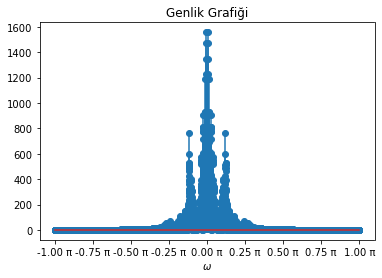

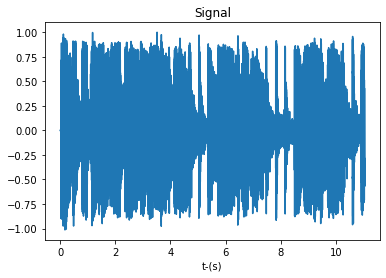

In [3]:
######## MENU SYSTEM #########

print("""
AUDIO FILES:
1. Better Call Saul - Intro Song 
2. ...
3. ...
4. ...
5. ...
""")
ans=input("Choose an audio file: ")
if ans=="1":
    Read_Audio("bcs-intro.wav")
elif ans=="2":
    Read_Audio("")
elif ans=="3":
    Read_Audio("")
elif ans=="4":
    Read_Audio("")
elif ans=="5":
    Read_Audio("") 

display(Audio(gsignal, rate=Fs))    

### Audio Effects: 

***************************
 *   1. Reverse Effect     *
 *   2. Echo Effect        *
 *   3. Speed Effect       *
 *   4. Distortion Effect  * 
 *   5. Bass Effect        *
 *   6. Treble Effect      *
 *   7. Reverb Effect      *
 *   8. Equalizer Settings *  
***************************


## 1. Reverse Effect

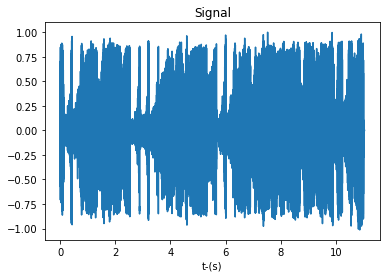

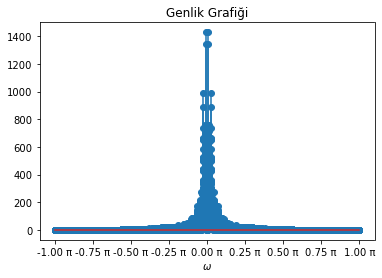

In [20]:
reverse_audio = set_reverse(xn)
Plot_Waveform(reverse_audio, Fs)
Plot_Spectrum(reverse_audio, Fs)
display(Audio(reverse_audio, rate=Fs))

## 2. Echo Effect

Choose delay: 0.5
Choose gain: 0.7


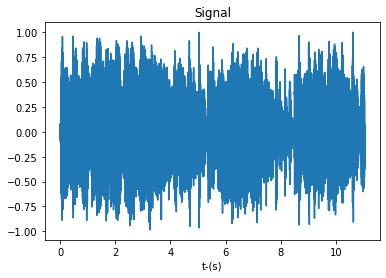

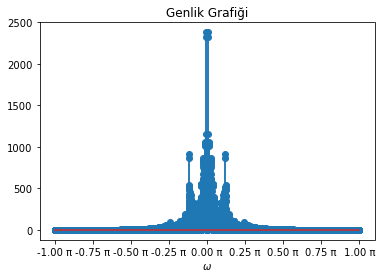

In [5]:
delay = float(input("Choose delay: "))
gain = float(input("Choose gain: "))
echo_audio = set_echo(delay, xn, gain) 
Plot_Waveform(echo_audio, Fs)
Plot_Spectrum(echo_audio, Fs)
display(Audio(echo_audio, rate=Fs))    

## 3. Speed Effect

Choose speed factor: 2


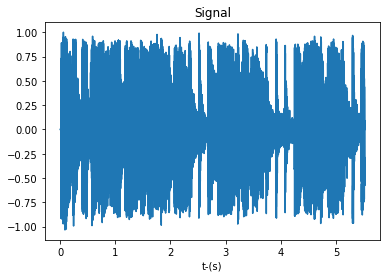

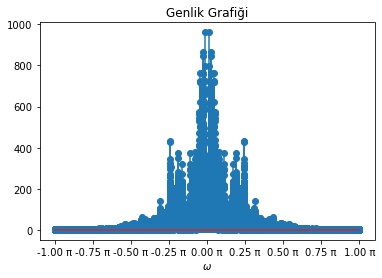

In [6]:
speed_factor = float(input("Choose speed factor: "))
speed_audio = set_speed(speed_factor, xn)
Plot_Waveform(speed_audio, Fs)
Plot_Spectrum(speed_audio, Fs)
display(Audio(speed_audio, rate=Fs))    

## 4. Distortion Effect

Choose gain: 5


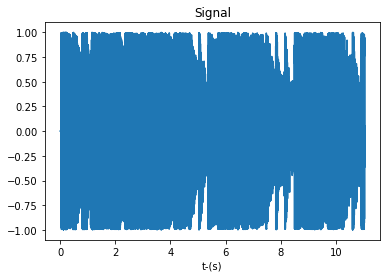

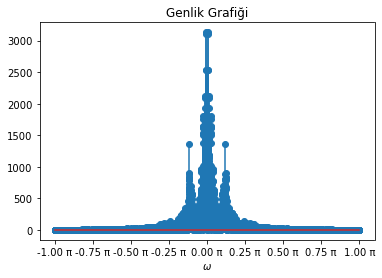

In [7]:
gain = float(input("Choose gain: "))
dist_audio = distortion(xn, gain)
Plot_Waveform(dist_audio, Fs)
Plot_Spectrum(dist_audio, Fs)
display(Audio(dist_audio, rate=Fs))

## 5. Bass Effect

Choose gain: 10
Pure Bass


Output signal with Bass Effect


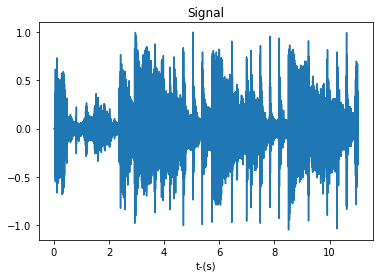

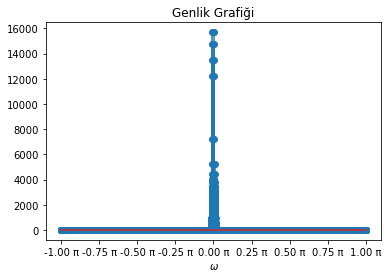

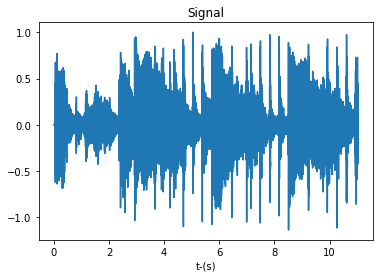

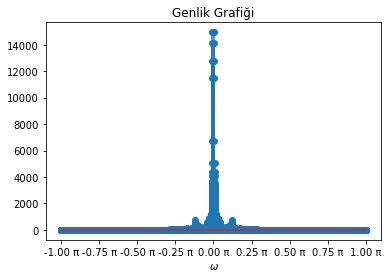

In [8]:
gain = float(input("Choose gain: "))
bass_audio,yn = bass_effect(xn, gain)
print("Pure Bass")
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(yn, rate=Fs))
print("Output signal with Bass Effect")
Plot_Waveform(bass_audio, Fs)
Plot_Spectrum(bass_audio, Fs)
display(Audio(bass_audio, rate=Fs))

## 6. Treble Effect

Choose gain: 10
Pure Treble


Output signal with Bass Effect


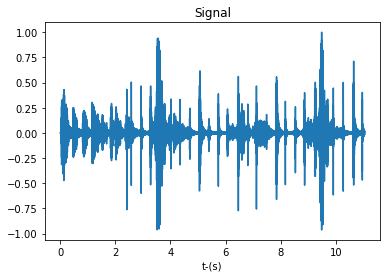

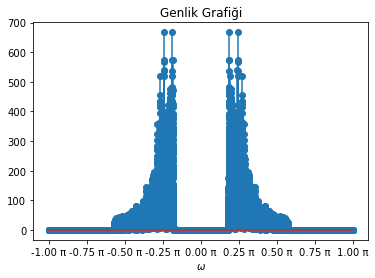

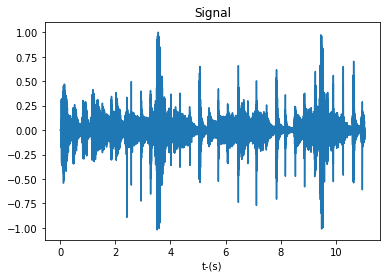

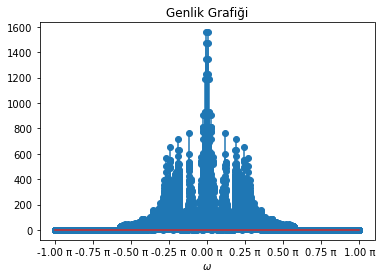

In [9]:
gain = float(input("Choose gain: "))
treble_audio,yn = treble_effect(xn, gain)
print("Pure Treble")
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(yn, rate=Fs))
print("Output signal with Bass Effect")
Plot_Waveform(treble_audio, Fs)
Plot_Spectrum(treble_audio, Fs)
display(Audio(treble_audio, rate=Fs))

## 7. Reverb Effect

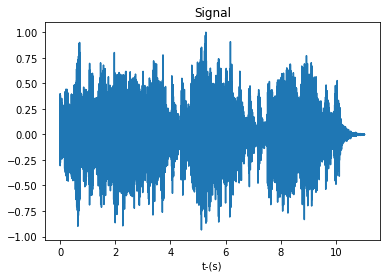

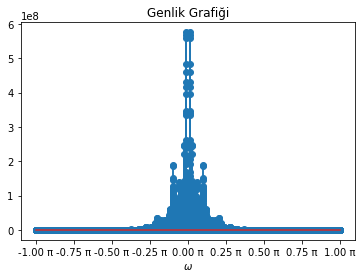

In [10]:
reverb_audio = reverb('bcs-intro.wav', xn)
Plot_Waveform(reverb_audio, Fs)
Plot_Spectrum(reverb_audio, Fs)
display(Audio(reverb_audio, rate=Fs))

## 8. Equalizer

In [11]:
print("""
MODES:
1. Sub-Bass
2. Bass
3. Lower Mids
4. Mids
5. Upper Mids
6. Highs
""") 


MODES:
1. Sub-Bass
2. Bass
3. Lower Mids
4. Mids
5. Upper Mids
6. Highs



#### 8.1 Mode Sub-Bass

Choose gain: 10


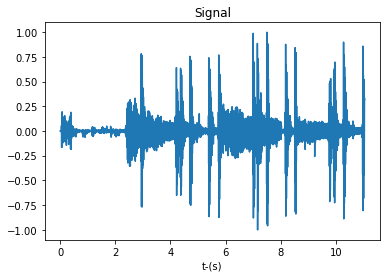

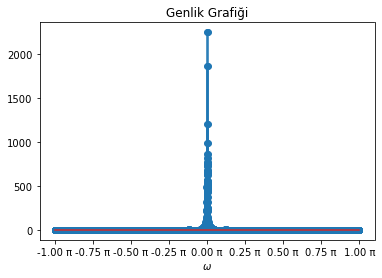

In [12]:
mode = 1
gain = float(input("Choose gain: "))
equ_audio,yn = equalizer(xn, gain, mode)
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(equ_audio, rate=Fs))

#### 8.2 Mode Bass

Choose gain: 10


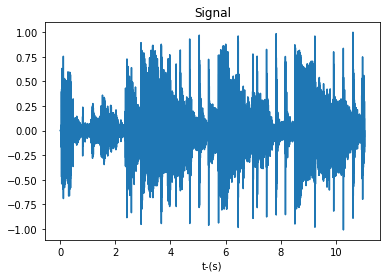

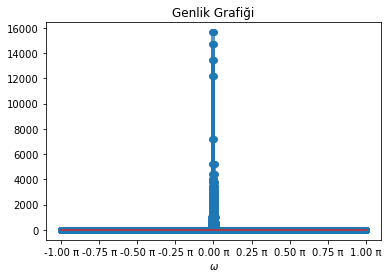

In [13]:
mode = 2
gain = float(input("Choose gain: "))
equ_audio,yn = equalizer(xn, gain, mode)
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(equ_audio, rate=Fs))

#### 8.3 Mode Lower Mids

Choose gain: 10


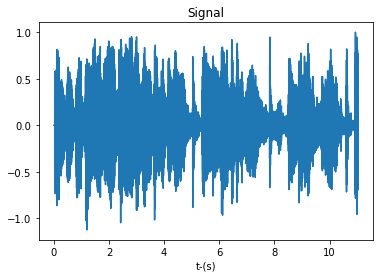

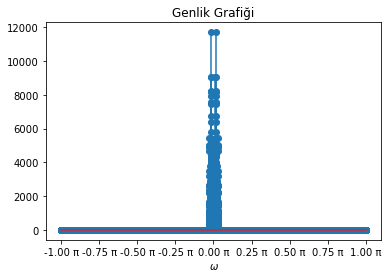

In [14]:
mode = 3
gain = float(input("Choose gain: "))
equ_audio,yn = equalizer(xn, gain, mode)
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(equ_audio, rate=Fs))

#### 8.4 Mode Mids

Choose gain: 10


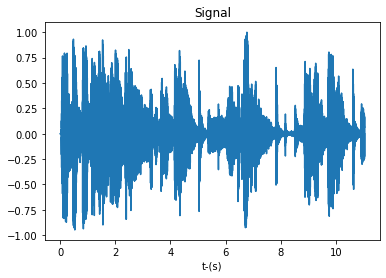

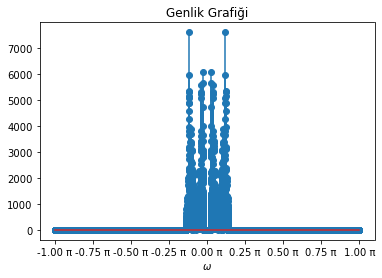

In [15]:
mode = 4
gain = float(input("Choose gain: "))
equ_audio,yn = equalizer(xn, gain, mode)
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(equ_audio, rate=Fs))

#### 8.5 Mode Upper-Mids

Choose gain: 10


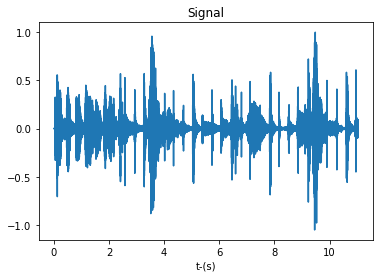

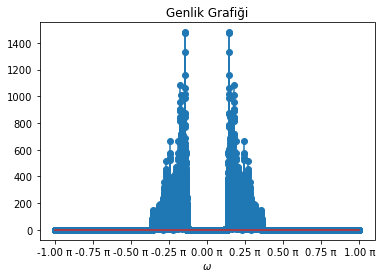

In [16]:
mode = 5
gain = float(input("Choose gain: "))
equ_audio,yn = equalizer(xn, gain, mode)
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(equ_audio, rate=Fs))

#### 8.6 Mode Highs

Choose gain: 10


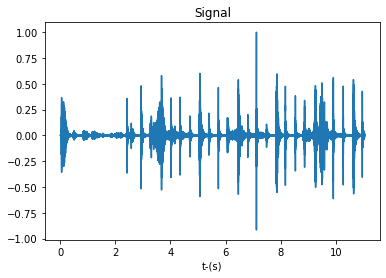

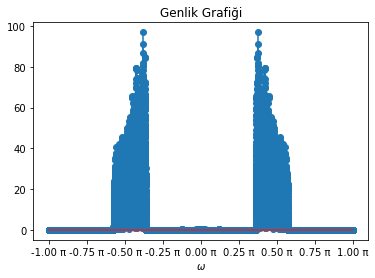

In [17]:
mode = 6
gain = float(input("Choose gain: "))
equ_audio,yn = equalizer(xn, gain, mode)
Plot_Waveform(yn, Fs)
Plot_Spectrum(yn, Fs)
display(Audio(equ_audio, rate=Fs))